In [1]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

os.chdir()

In [3]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [19]:
MODEL_PATH_ROOT = "/mnt/omreast_users/phhale/csiro_trashnet/experiments/ds0/tfodapi/"
#MODEL_PATH = "ssdlite_v2_core_min_022920/"
#MODEL_PATH = "ssd_incpetion_v2_core_exp_030120_step101k/"


#MODEL_PATH = "ssd_v1_fpn_customV3_core_exp_030920_step16k/"
MODEL_PATH = 'frcnn_inception_v2_ds0_101620_step35k'

PATH_TO_CKPT = os.path.join(MODEL_PATH_ROOT, MODEL_PATH, "frozen_inference_graph.pb")


PATH_TO_LABELS = os.path.join(MODEL_PATH_ROOT, MODEL_PATH,  "labelmap.pbtxt")

NUM_CLASSES = 3

In [20]:
# Load the label map.
# Label maps map indices to category names, so that when our convolution
# network predicts `5`, we know that this corresponds to `king`.
# Here we use internal utility functions, but anything that returns a
# dictionary mapping integers to appropriate string labels would be fine
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [24]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)

In [27]:
import cv2

In [29]:
PATH_TO_IMAGE = '/mnt/omreast_users/phhale/csiro_trashnet/datasets/csior_test_images/csior_crop_test_01/csior_test_custom1_000000000214.jpg'

In [38]:
PATH_TO_TEST_IMAGES_DIR = '/mnt/omreast_users/phhale/csiro_trashnet/datasets/csior_test_images/csior_crop_test_01/'
TEST_IMAGE_PATHS= os.listdir(PATH_TO_TEST_IMAGES_DIR)
TEST_IMAGE_PATHS[:5]

['csior_test_custom1_000000000214.jpg',
 'csior_test_custom1_000000001322.jpg',
 'csior_test_custom2_000000001322.jpg',
 'csior_test_custom3_000000001322.jpg',
 'csior_test_custom_000000000214.jpg']

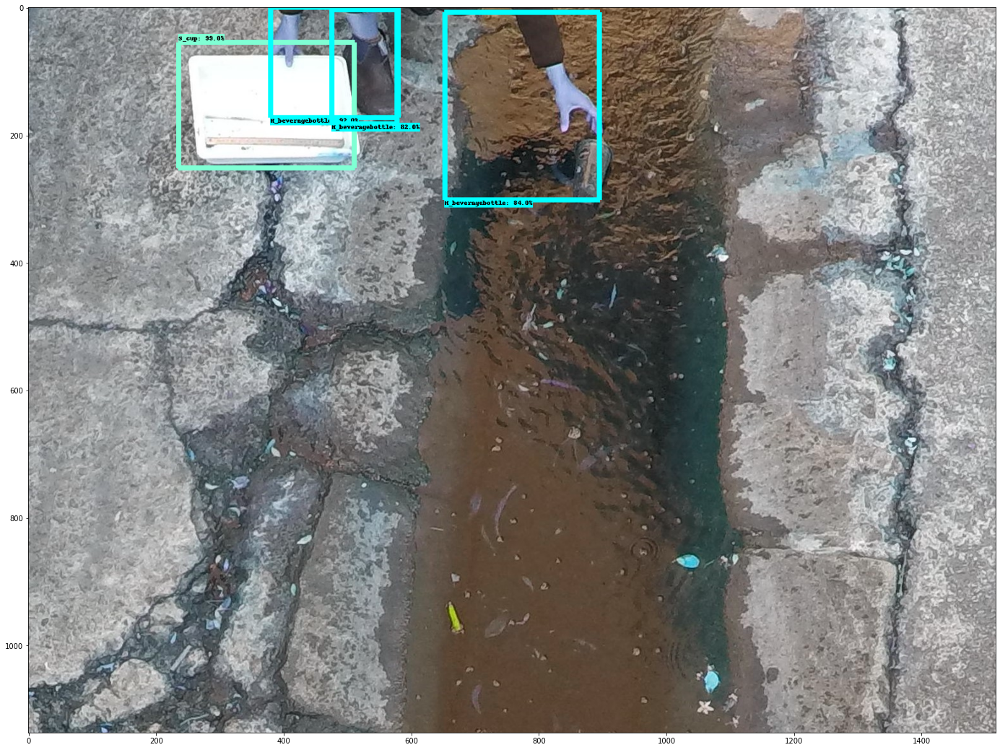

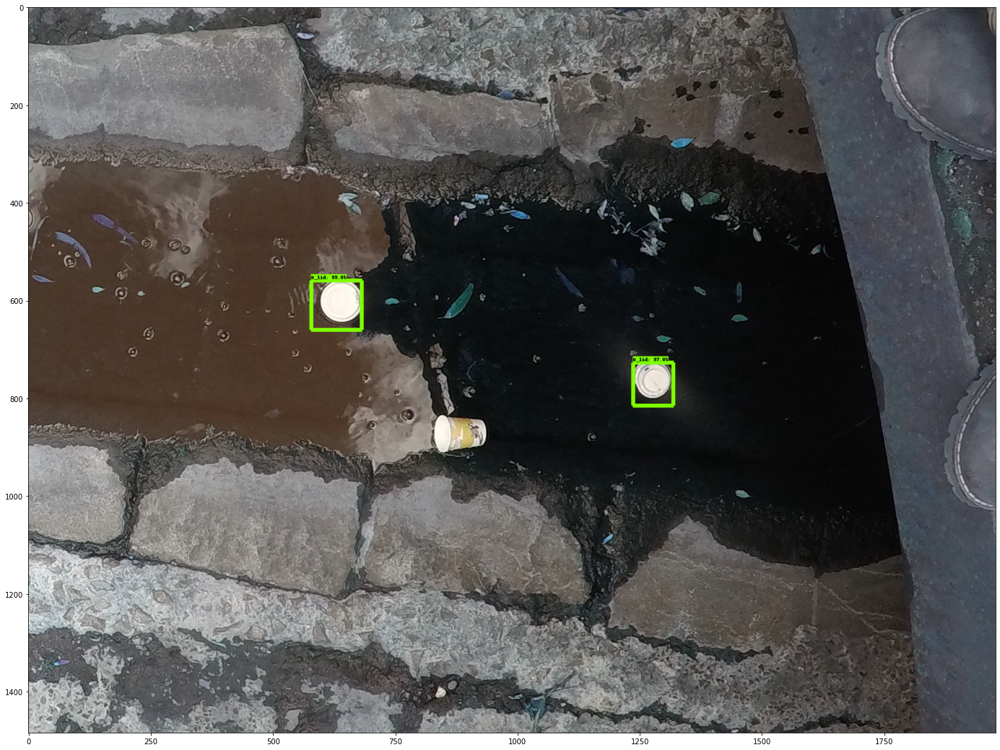

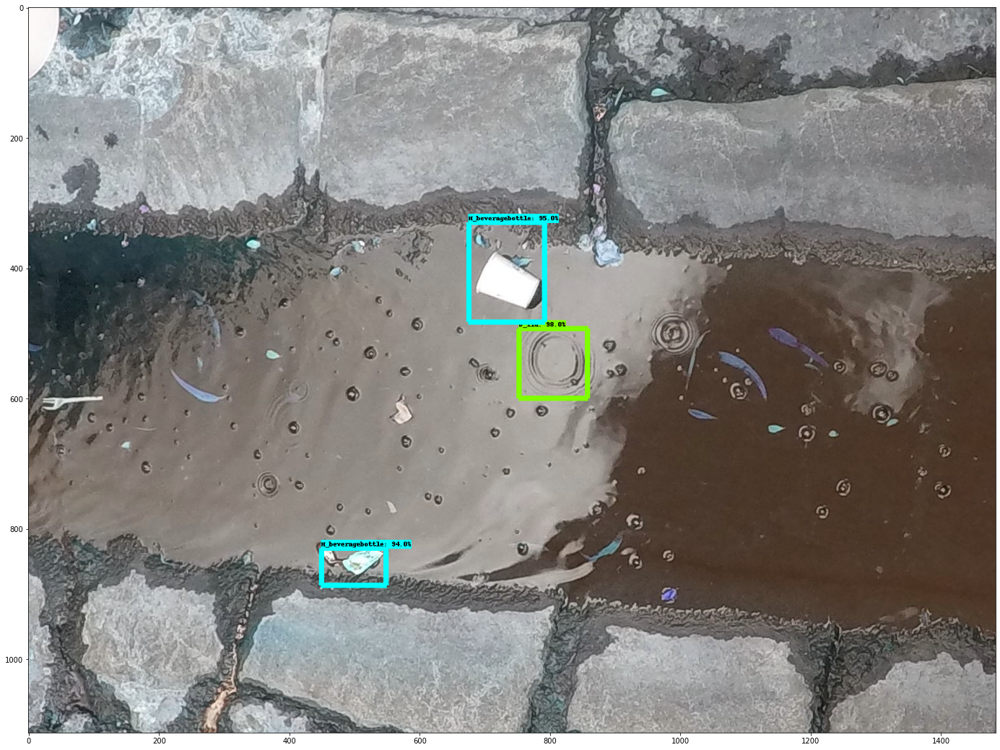

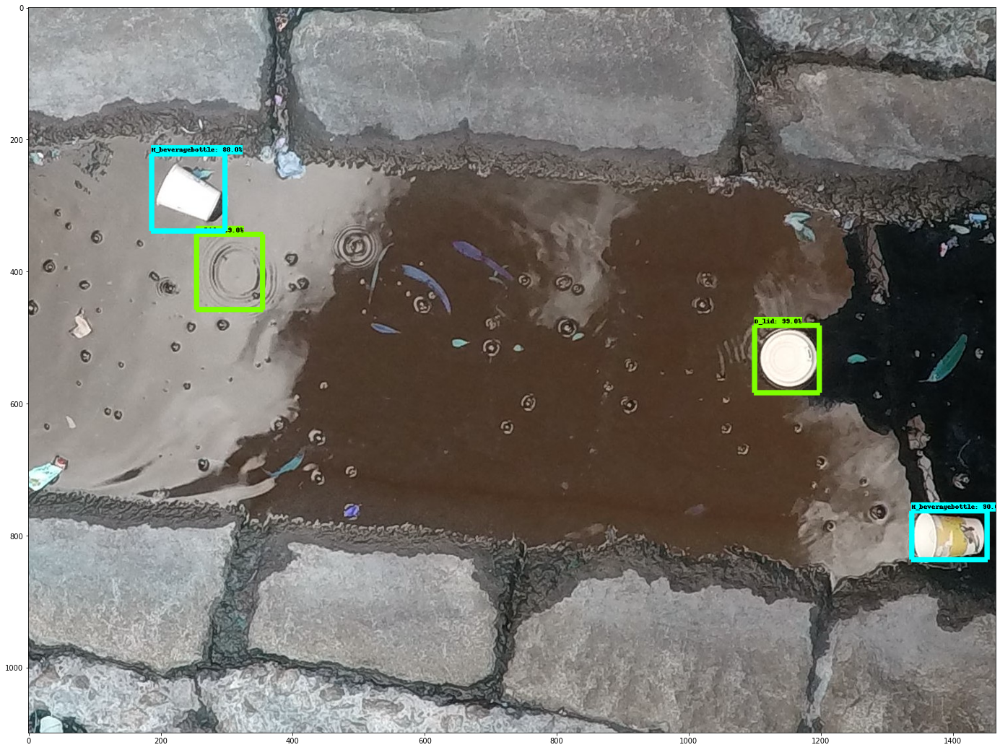

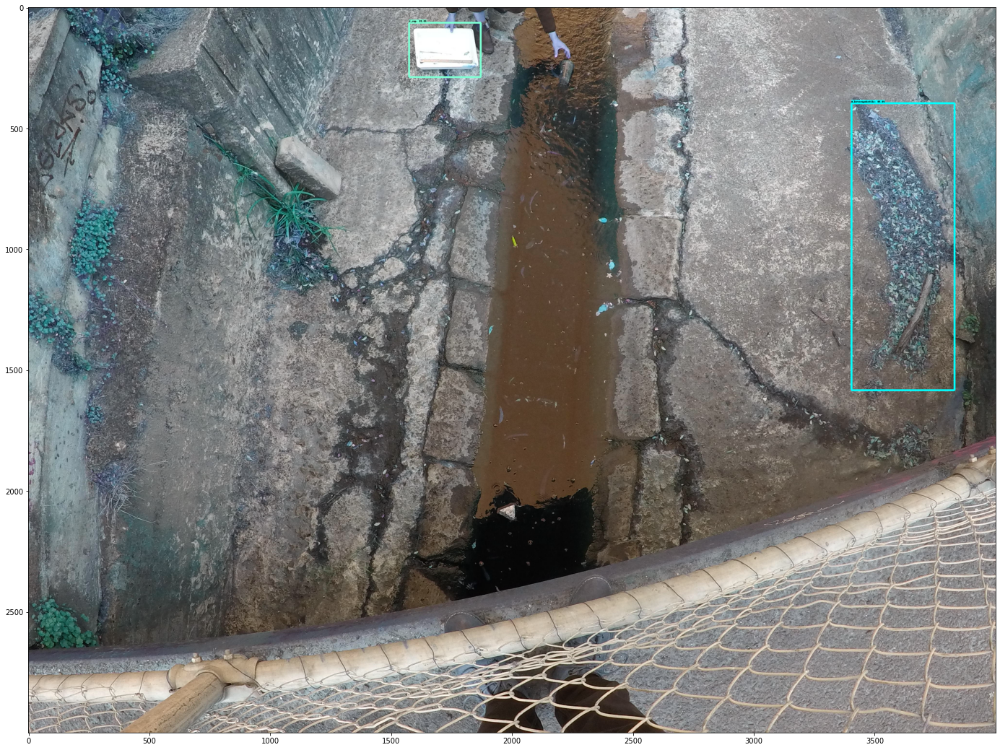

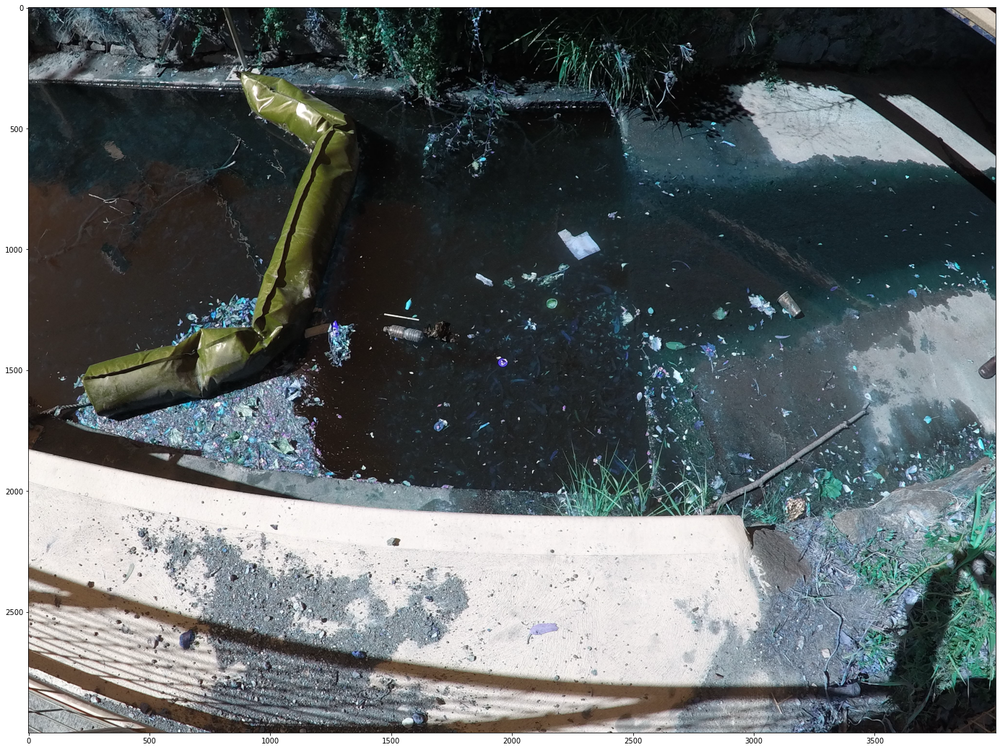

In [49]:

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
       # Input tensor is the image
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

        # Output tensors are the detection boxes, scores, and classes
        # Each box represents a part of the image where a particular object was detected
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

        # Each score represents level of confidence for each of the objects.
        # The score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

        # Number of objects detected
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        img_idx = 0

        for image_path in TEST_IMAGE_PATHS:
            # Open the image file
            #image = Image.open(PATH_TO_TEST_IMAGES_DIR+image_path)
            image = cv2.imread(PATH_TO_TEST_IMAGES_DIR+image_path)

            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            #image_np = load_image_into_numpy_array(image)

            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_expanded = np.expand_dims(image, axis=0)

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

            # Visualization of the results of a detection.
            viz_utils.visualize_boxes_and_labels_on_image_array(
                image,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=8,
                min_score_thresh=0.75)
            plt.figure(figsize=(24, 32))
            plt.imshow(image)

            # Save the image to a folder
            #im = Image.fromarray(image_np)
            #im.save(PATH_TO_OUTPUT_IMAGES_DIR + "/" + str(img_idx).zfill(7) + ".jpg")
            #im.save(PATH_TO_OUTPUT_IMAGES_DIR + str(img_idx).zfill(7) + ".jpg")
            #img_idx += 1


In [59]:
import random, shutil
copy_folder_imgs = '/mnt/omreast_users/phhale/csiro_trashnet/original_samples/Subset_Trashnet/'
copy_images = os.listdir(copy_folder_imgs)

MOVE_IMG_PATH = '../detect_and_crop/images/original/'
samples_test_images = random.choices(copy_images, k=5)
for f in samples_test_images:
    current = os.path.join(copy_folder_imgs,f)
    target = os.path.join(MOVE_IMG_PATH,f)
    shutil.copy(current, target)
    
print("done.")

done.


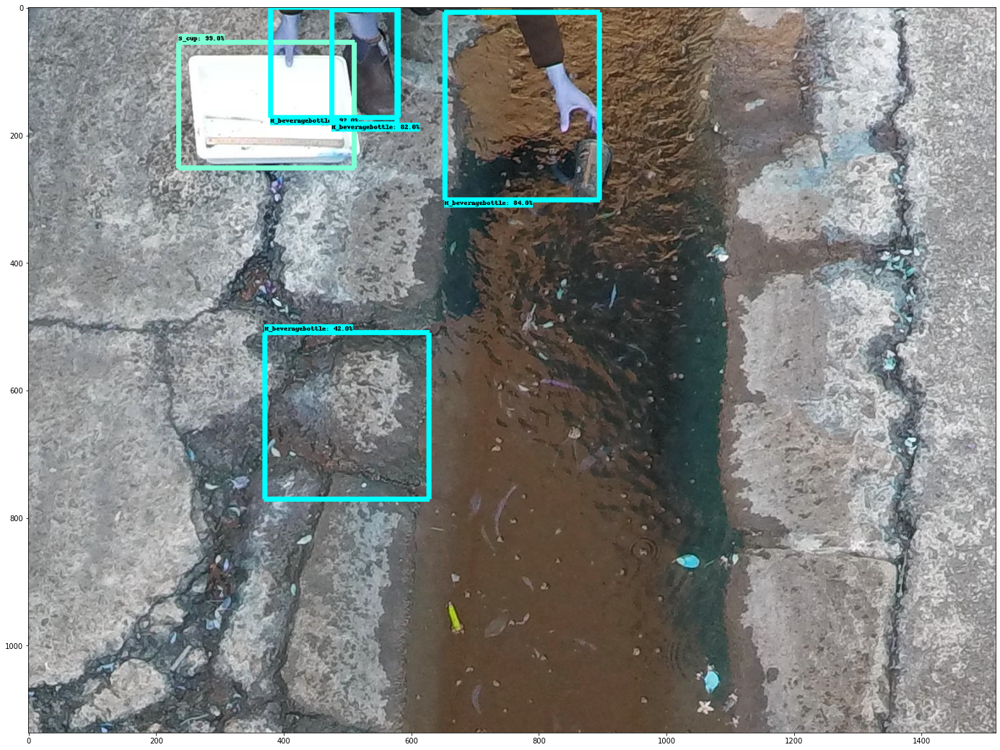

In [35]:
# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')

# Load image using OpenCV and
# expand image dimensions to have shape: [1, None, None, 3]
# i.e. a single-column array, where each item in the column has the pixel RGB value
image = cv2.imread(PATH_TO_IMAGE)
image_expanded = np.expand_dims(image, axis=0)

# Perform the actual detection by running the model with the image as input
(boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

# Draw the results of the detection (aka 'visulaize the results')

viz_utils.visualize_boxes_and_labels_on_image_array(
    image,
    np.squeeze(boxes),
    np.squeeze(classes).astype(np.int32),
    np.squeeze(scores),
    category_index,
    use_normalized_coordinates=True,
    line_thickness=8,
    min_score_thresh=0.40)

plt.figure(figsize=(24, 32))
#plt.imshow(image_np_with_detections[0])
plt.imshow(image)
# All the results have been drawn on image. Now display the image.
